# EDA - The Application

## Learning Objectives
- Apply the knowledge gained!

Welcome to the final notebook in the EDA chapter! In this notebook, we'll be applying EDA on a regression problem, finishing it up by building a model to predict houes prices on some given data. This notebook will be quite comprehensive, and will be an application of a large majority of techniques that were taught in this chapter.

We'll be working on a popular dataset of house prices known as [House Prices: Advanced Regression Techniques](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data?select=train.csv). It consists of 79 feautres, and has already been split up into a train and test set. We are also provided with a data dictionary/description file. Reading this should *always* be your first step if it is available, so lets start with that. Note that "NaN" here isn't often standing for missing value - but rather the lack of a variable. We'll look for missing data when working with a particular variable.

We'll be predicting sale price 👍; and now that we've finished reading the description, let's get started (by loading in the data)

In [1]:
import pandas as pd
house_orig_df = pd.read_csv("../DATA/house_prices/train.csv")
house_orig_df.drop("Id", axis=1, inplace=True)
house_orig_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


As we gathered from the data description file... there are a lot of columns. As with any software project we embark on, one of the hardest things to do is knowing *where* to get started. This was probably mentioned prevously, but we need to start somewhere. This 'somewhere' should have been backed by good intuition, and when approached with a dataset which has many features like this, I have found it useful to write up an excel file which keeps track of how valuable each variable _could_ be on the sale price. The following columns should be satisfactory:
- Variable Name
- Type (numeric or categorical)
- Expectation (1-5 scale)
- Comments


In [2]:
# Just so we can copy and paste
print(house_orig_df.columns.tolist())

['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fen

Cool! So the above exercise allowed us to get a deeper dive into what we can expect from the data. Despite the analysis we can perform with numerical data against each other (i.e. correlation matrices), we should still take a preliminary look at the data we rated highly to try and identify general trends. For categorical data however, it is probably best that we follow our intuition, and visualise those variables which we've assigned as ratings 4 or 5. 

Additionally, we know now any manipulations we could perform on our data. One slightly more interesting manipulation I thought of was to combine the porch square footage into one square footage variable. Let's create this now so we don't forget.

In [3]:
house_df = house_orig_df
porch_df = house_df[['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch']]
house_df["PorchSF"] = porch_df.sum(axis=1)

Prior to any of the aforementioned plotting, there are two things worth doing. Firstly, we should investigate any missing values. As already noticed, some variables have NA present to indicate a lack of a category instance instead of a missing value. In those instances, we should change the value of NA and then plot our data using the missingno package we were introduced to earlier. Secondly, I want to get a feel for our response 'SalePrice' - just to see what the distribution of the data looks like.

We'll start with the first point.

In [4]:
import numpy as np

variables_with_allowed_na = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]
to_update = {np.NaN: "None"}

for var in variables_with_allowed_na:
    house_df[var] = house_df[var].replace(to_update)
    
house_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PorchSF
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,None,None,None,0,2,2008,WD,Normal,208500,61
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,None,None,None,0,5,2007,WD,Normal,181500,0
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,None,None,None,0,9,2008,WD,Normal,223500,42
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,None,None,None,0,2,2006,WD,Abnorml,140000,307
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,None,None,None,0,12,2008,WD,Normal,250000,84


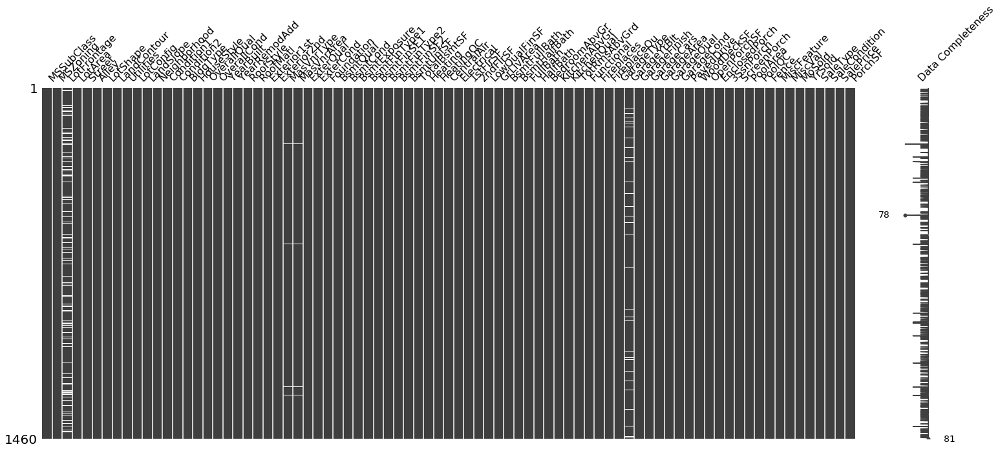

In [5]:
## Import and use missingno on house_df
import missingno as msno
msno.matrix(house_df, labels=True)

This plot is a bit difficult to read due to the amount of features we have. We could have cleaned it up by plotting subsets of our data, but it is always valuable to plot the whole dataframe initially so we can ascertain patterns of the missing values. There are four columns here with missing values: LotFrontage, MasVnrType, MasVnrArea and GarageYrBlt. 

LotFrontage has a lot of missing data in it - and this missing data doesn't seem to be correlated with another variable. This is most likely a case of Missing Not at Random (MNAR). I rated this as a "1" in my variable analysis, so I will be dropping this feature. If however, you suspected that LotFrontage has a significant affect on the sale price, or you're in a similar situation with another dataset where you'd like to have access to values from a variable with missing data, imputation is suitable approach.

With regards to the "Mas-" variables, it makes sense that where there are NA values (actual missing NA values) for the categorical variable, there'd be missing values for it's numeric counterpart. Whilst we're not considering these features, dropping the features seems overkill (as there only seem to be 4 missing values). Instead, we'll simply delete the rows where these missing values are present. When we plot our correlation matrix for our numeric variables later on, it'd be intesreting to see how much affect MasVnrArea would have with sale price. Other approaches could have been to impute the missing values.

With respect to GarageYrBlt, we have a somewhat decent amount of missing values (although in reality it's probably a lot lower than what the figure makes it out to be due to having to plot 1460 rows). Here, similar to the last case, the values are probably missing when an NA is present in GarageType. We don't see the NA values in GarageType because we replaced those values with "None". I don't suspect this feature is too important and GarageType will probably give us more information about the sale price than the year it was built, so I would advocate for dropping this feature.

To summarise, we are going to: Drop LotFrontage and GarageYrBlt, and delete the rows where an NA is present in MasVnrType/Area. Subsequently, we'll plot a histogram of sale price.

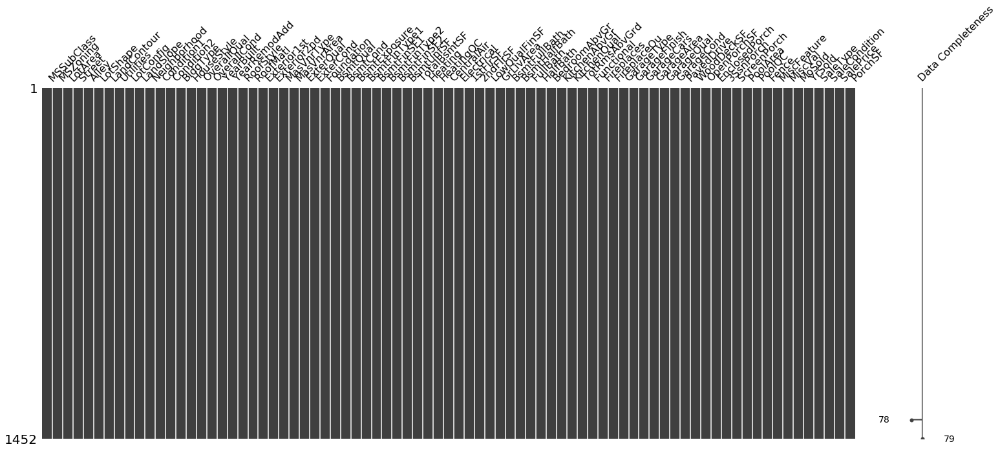

In [6]:
## Drop LotFrontage and GaragaeYrBlt
## Drop the NAs in MasVnrType and MasVnrArea
house_df = house_df.drop(["LotFrontage", "GarageYrBlt"], axis=1)
house_df = house_df.dropna(subset=["MasVnrType", "MasVnrArea"])
msno.matrix(house_df, labels=True)

In [7]:
import plotly.express as px

px.histogram(house_df, "SalePrice", marginal="violin", title="Histogram of SalePrice (response)")

Looks like we got a heavily right tailed distribution. There are a couple of houses with extraordinarily high values (\\$500k+) which would most likely influence our models. We'll make a mental note that these exist, and as we analyse the other data, we'll see why this could be the case (and whether dropping it could be a worthwhile endeavour).

The plot above the histogram is known as a *violin* plot. It is similar to a box plot and allows us to estimate the density of the population data. As seen (from both plots), the bulk of our data lies within the \\$100k - \\$200k range.

Let's look at our categorical data. Since they haven't been introduced yet (par just now), we'll look at a violin plot for one. Subsequently, using subplots and violin plots, we'll plot the data we rated highly against sales price.

In [8]:
categorical_data = ["MSSubClass", "MSZoning", "LotConfig", "Neighborhood", "OverallQual", "OverallCond", "YearBuilt", "YearRemodAdd", "ExterCond", "BsmtQual", "BsmtCond", "BsmtFinType1", "BsmtFinType2", "CentralAir", "KitchenQual", "Functional", "PavedDrive", "PoolQC", "Fence", "MiscFeature"]

fig = px.violin(house_df, y="SalePrice", x="MSSubClass", box=True, points="all", title="Type of dwelling vs sale price")
fig.update_layout(xaxis_type="category", xaxis={'categoryorder':'mean ascending'})

(I'm not performing any analysis here because this is more for demonstrative purposes about what a violin plot is). As we can see, they are quite similar to box plots, but additionaly show a [kernel density estimation](https://en.wikipedia.org/wiki/Kernel_density_estimation). In laymans terms, the fatter the part on the violin, the more data points near there. Using `points="all"`, I've plotted the the actual points. We won't use these in our subplots, because they take up about half the horizontal space on the graph. With them turned off, we are still able to visualise the outliers.


In [9]:
## Create subplots of all of the categorical data
from plotly.subplots import make_subplots
import plotly.graph_objects as go

rows = (len(categorical_data) // 2)
cols = 2
subplot_titles = tuple(cat + " vs Sale Price" for cat in categorical_data)
fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)

for i, cat in enumerate(categorical_data):
    row = (i // cols) + 1
    col = (i % cols) + 1
    
    fig.add_trace(go.Violin(
        x=house_df[cat], y=house_df["SalePrice"], name=cat, box_visible=True
    ), row=row, col=col)
    
    fig.update_xaxes(patch=dict(type='category', categoryorder='mean ascending'), row=row, col=col)
    
    
fig.update_layout(height=4000)
fig.show()

Hmmmm... one common trend I'm noticing is that those influential datapoints we identified earlier on are really distorting these plots. Let's remove all the values above \\$600k and try again.

In [10]:
house_df = house_df[house_df["SalePrice"] < 600000]
house_df

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PorchSF
0,60,RL,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,2,2008,WD,Normal,208500,61
1,20,RL,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,...,None,None,None,0,5,2007,WD,Normal,181500,0
2,60,RL,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,9,2008,WD,Normal,223500,42
3,70,RL,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,...,None,None,None,0,2,2006,WD,Abnorml,140000,307
4,60,RL,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,...,None,None,None,0,12,2008,WD,Normal,250000,84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,8,2007,WD,Normal,175000,40
1456,20,RL,13175,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,MnPrv,None,0,2,2010,WD,Normal,210000,0
1457,70,RL,9042,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500,60
1458,20,RL,9717,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,4,2010,WD,Normal,142125,112


In [11]:
rows = (len(categorical_data) // 2) 
cols = 2
subplot_titles = tuple(cat + " vs Sale Price" for cat in categorical_data)
fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)

for i, cat in enumerate(categorical_data):
    row = (i // cols) + 1
    col = (i % cols) + 1
    
    fig.add_trace(go.Violin(
        x=house_df[cat], y=house_df["SalePrice"], name=cat, box_visible=True
    ), row=row, col=col)
    
    fig.update_xaxes(patch=dict(type='category', categoryorder='mean ascending'), row=row, col=col)
    
    
fig.update_layout(height=4000, title="Violin plots of feature vs Sale Price", showlegend=False)
fig.show()

So... what exactly are we looking for:
- **General trends** - this point is pretty obvious, but ordering of the x axis can confuse the way we interpret the data sometimes. Here I've ordered the data by "mean ascending", meaning that if we see an increase from left to right, the variable is probably important.
- **The relationship between "None" and the house sale price.** If "None" covers almost the whole span of the data, then we know that the presence of a value in that category doesn't have too significant of an affect on the sale price.
- **Do ordinal variables perform as expected.** - This is a generalisation of the point above. We expect the highest ranking ordinal variable to have an impact on the response. If this isn't the case, then no point in considering the variable.
- **Variables to investigate further.** With some of these plots, perhaps due to the size of the plot or the acutal amount of data avaiable, it'd be worthwhile to do another kind of plot to see the data in a different fashion.

Can you think of anything else?

Let's identify variables for these points.
- Variables **without** general trends:
  - ExterCond
  - OverallCond
  - LotConfig
- Variables with majority "None":
  - MiscFeature
  - Fence
  - PoolQC
- Variables with ordinals performing unituitively:
  - BsmtFinType1
  - BsmtFinType2
  - BsmtCond
  - ExterCond
- Variables to investigate further:
  - Neighborhood
  - YearBuilt
  - YearRemodAdd

Wow! Just this one visualisation was a quick way to cut a lot of variables out of our things of list to consider. As an advocate of performing my work to the utmost quality and to learn the most I can with the data in front of me, with the variables we kept in, I would do individual plots to analyse and leave my comments about each variable further. For teaching consiceness, I will omit this, but as was done in one of the previous notebooks we should be making comments about each plot that we make.

In [12]:
cat_vars_to_remove = ["ExterCond", "OverallCond", "LotConfig", "MiscFeature", "Fence", "BsmtFinType1", "BsmtFinType2", "BsmtCond", "ExterCond", "PoolQC"]

## Remove a list from another list
categorical_data = [var for var in categorical_data if var not in cat_vars_to_remove]
categorical_data

['MSSubClass',
 'MSZoning',
 'Neighborhood',
 'OverallQual',
 'YearBuilt',
 'YearRemodAdd',
 'BsmtQual',
 'CentralAir',
 'KitchenQual',
 'Functional',
 'PavedDrive']

A lot more dealable! Let's take a look at those variables of interest in isolation.

In [13]:
fig = px.box(house_df, x="Neighborhood", y="SalePrice", title="Neighborhood vs Sale Price")
fig.update_layout(xaxis={'categoryorder':'mean ascending'})

Looks very sporadic with highs and lows in different neighborhoods. What gives me confidence behind this variable is that the variables with low prices typically have a small range (e.g. Sawyer, IDOTRR etc). The variables with higher prices do have a larger range, but perhaps the reason for this could be that, as we would expect, houses with less bedrooms are worth less. So while Sawyer may have 5 bedroom house at $190k, NridgHt might have a 2 bed at a similar price. Hence we can expect the range of richer areas to be larger than that of smaller. Actually, we can visualise this.

Oldtown, a relatively 'poor' area, has one house disproportionally priced. Otherwise, all good - let's keep the variable.

In [14]:
fig = px.box(house_df, x="Neighborhood", y="SalePrice", color="BedroomAbvGr", title="Neighborhood vs Sale Price")
fig.update_layout(xaxis={'categoryorder':'mean ascending'})

What's your analysis?

Let's look at YearBuilt now.

In [15]:
px.box(house_df, x="YearBuilt", y="SalePrice", title="Year Built vs Sale Price")

Some datapoints, namely the older ones, are lacking data. The cols at 1880, 1892, 1932, 1934, 1935 show some disproportionally high prices, but apart from this the general trend seems to be that more modern house prices are worth more. It's worth keeping this variable in.

In [16]:
px.box(house_df, x="YearRemodAdd", y="SalePrice", title="Year Remodelled vs Sale Price")

It looks like there's a weak trend here - with houses modelled more recently having being worth more. There's nothing too out of the ordinary here and the positive trend is as expected, so let's keep this in too. 

Great - we now have the categorical data we want to work with. Let's move onto the numeric case. We can approach this problem in many ways. Here, I will firstly investigate the columns that I suspect to be influential in a similar fashion to the categorical data. Following this analysis, we'll then plot a (massive) correlation matrix which can confirm which variables (including their augmented counterparts) could be important to keep. We'll then combine the identified categorical variables and identified numeric variables, and create a function which will fit many models and run ANOVA over them to identify the final list of variables we'll feed into our model. Simple right? I'm also considering to augment all numeric variables with three operations: quadratic, cubic, and logarithmic. We'll see what the visualisations are saying though. Let's get started!

In [17]:
## Scatter plot the numeric data
numeric_data = ["LotArea", "GrLivArea", "BsmtFullBath", "FullBath", "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd", "Fireplaces", "GarageArea", "PoolArea", "MiscVal", "PorchSF"]

rows = (len(numeric_data) // 2)
cols = 2
subplot_titles = tuple(var + " vs Sale Price" for var in numeric_data)
fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)

for i, cat in enumerate(numeric_data):
    row = (i // cols) + 1
    col = (i % cols) + 1
    
    fig.add_trace(go.Scatter(
        x=house_df[cat], y=house_df["SalePrice"], mode="markers"
    ), row=row, col=col)
    
    
    
fig.update_layout(height=4000, title="Scatter plots of feature vs Sale Price", showlegend=False)
fig.show()

Some interesting results... Let's create a list as to what we're looking for and then see whether our variables follows one of these patterns:
- **Does an increase in x lead to an increase in y?** We'd expect that as a value of a feature increases, so does the value of the house
- **Are there are any leverage/outliers/influential points?** As seen in the previous notebook, we need to exercise caution when dealing with these datapoints
- **Does the plot require further investigation?** Some plots may not exihibt a strong linear trend. Perhaps another visualisation technique, some form of augmentation of a variable, or even removing a datapoint may lead us to a different conclusion.

Instead of categorising the above plots by the above list, as we did with categorical data, it seems more worthwhile to analyse these plots one by one:
- **LotArea**: We see a clear trend that as the lot area increases, so does the sale price. Datapoints above 35k seem to break this trend however - and there is one incredibly sporadic datapoint in there (@~215k). I would have thought a house having a lot area of 35k would imply that it is probably an argricultural property, but our dataset doesn't actually consist of these (as seen by the MSZoning plot in the categorical data). I'm going to make the decision to remove houses from the dataset that are above 35k in LotArea.
- **GrLivArea**: Against, a strong trend. There are some leverage points but these don't look *too* influential. There are two clear outliers which I will remove (the two above 4000).
- **BsmtFullBath**: No real trend in this variable. We'll remove it from the list we're considering
- **FullBath**: Valuable trend! However, over 1400 datapoints were collected and the maximum number of bathrooms we see were 3. I'm going to convert this data to a categorical variable as it'll suit a linear regression model better (as we can have coefficients per category)
- **BedroomAbvGr**: Same as above. We're lacking data for 5 bedroom and above properties, although the general (heuristically identified) indication based *purely* on this variable is after 4 bedrooms the house price does not increase. However, if we look at TotalRmsAboveGrd, we can see there is an increase in sale price with the number of rooms. I think it's safer bet to rely on TotalRmsAboveGrd than BedroomAbvGr, so, based on the upcoming analysis, perhaps it's safer to remove this variable.
- **KitchenAbvGr**: Despite being another variable we could model as an ordinal categorical, there isn't a trend with the increase of it and sale price. I would drop this variable from the list that we are considering
- **TotalRmsAboveGrd**: As mentioned briefly in BedroomAbvGr, this seems to be a valuable variable to continue our analysis with. We'll use its categorical variant however.
- **Fireplaces**: We see a clear increase of the lowest value properties increasing as the number of fireplaces increase. I'm not fully convinced by this trend however. To this end, I'll keep this variable in and we'll see what ANOVA and OLS are saying about its significance. Again, perhaps this is better as a categorical variable.
- **GarageArea**: Strong trend with some outliers. We'll delete these outliers (i.e. GarageArea above 1247)
- **PoolArea**: Only very few properties have a pool it seems. Despite there being an increase in price with the properties that do, there isn't enough data for a good conclusion. I'm leaning towards dropping this variable, but we'll let ANOVA decide 👍
- **MiscVal**: Strong trend but with some clear outliers and some leverage points. I want to remove these outliers (initially those above 3499) and revisualise this.
- **PorchSF**: Clear trend but there are some outliers and leverage points again. Again, I'm going to remove these outliers. I'm also curious about augmenting this variable with a polynomial term so we'll fit a linear model just on this variable to see how such an augmentation performs.

To summarise:
- Variables with outliers to be removed:
  - LotArea (above 35k)
  - GrLivArea (above 4k)
  - GarageArea (above 1247)
  - MiscVal (above 3499)
  - PorchSF (above 500)
- Variables to convert to categorical data:
  - *FullBath*
  - BedroomAboveGr
  - KitchenAbvGr
  - *TotalRmsAboveGrd*
  - *Fireplaces*

The italicised variables are the ones we want to keep. Regarding the variables we'll said we'll drop, I'll keep them in for now and we'll perform a few steps more of analysis. They will probably end up being irrelevant anyway.

Let's deal with the outliers.

In [18]:
## Remove the outliers
vars_with_outliers_threshold = [("LotArea", 35000), ("GrLivArea", 4000), ("GarageArea", 1247), ("MiscVal", 3499), ("PorchSF", 500)]

for var_name, threshold in vars_with_outliers_threshold:
    house_df = house_df[house_df[var_name] < threshold]
    
house_df

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PorchSF
0,60,RL,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,2,2008,WD,Normal,208500,61
1,20,RL,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,...,None,None,None,0,5,2007,WD,Normal,181500,0
2,60,RL,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,9,2008,WD,Normal,223500,42
3,70,RL,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,...,None,None,None,0,2,2006,WD,Abnorml,140000,307
4,60,RL,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,...,None,None,None,0,12,2008,WD,Normal,250000,84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,7917,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,8,2007,WD,Normal,175000,40
1456,20,RL,13175,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,MnPrv,None,0,2,2010,WD,Normal,210000,0
1457,70,RL,9042,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500,60
1458,20,RL,9717,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,...,None,None,None,0,4,2010,WD,Normal,142125,112


In [19]:
outlierd_data = [vn for vn, t in vars_with_outliers_threshold]

rows = len(outlierd_data)
cols = 1
subplot_titles = tuple(var + " vs Sale Price" for var in outlierd_data)
fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)

for i, cat in enumerate(outlierd_data):
    row = (i // cols) + 1
    
    fig.add_trace(go.Scatter(
        x=house_df[cat], y=house_df["SalePrice"], mode="markers"
    ), row=row, col=1)
    
    
    
fig.update_layout(height=4000, title="Scatter plots of feature vs Sale Price", showlegend=False)
fig.show()

Oh wow! Lots of different conclusions of this data now that we've visualsed it like this:
- **LotArea:** There is still a trend, but the data is wildly sporadic. This variable would be more promising if all the data above 15k was removed, but that would be a lot of data we're removing. We'll keep it as is for now, and se what further analysis indicates us to do.
- **GrLivArea:** I don't like how this 'fans' out. However, we have similar variance either side of an imaginary straight line we can imagine fitting
- **GarageArea:** Same as above
- **MiscVal:** Despite lacking on datapoints, we can see that there is a trend. Let's leave it as is.
- **PorchSF:** The data points are hugely choatic. Now that I'm seeing this plot like this, there doesn't seem to be any kind of trend. We're probably safe to drop this (we'll confirm whether this is the case with some more anaylsis later on).

I won't convert the numeric variables I identifed would be better as categorical just yet - we'll keep them in for now so we can plot a correlation matrix against them.

In [20]:
fig = px.imshow(house_df.corr(), title="Correlation heatmap of numerical values from house dataframe")
fig.update_layout(height=800)
fig.show()

I did suspect there to be some variables related to each other. It looks like GarageCars and GarageArea have a strong correlation with each other (0.88). Perhaps enough to consider multi-colinearity if we cared about model interpretability. It's up to the data scientist whether they would drop one of these or not. There are some other strong correlations in here too, such as TotalBsmtSF vs 1stFlrSF, and TotRmsAbvGrd vs GrLivArea. It makes sense why these variables would be heavily correlated with each other.

We should dig deeper into variable correlation vs SalePrice - considering that's going to be our response variable.

In [21]:
## Find a way to create a diagram which shows the top 15 highest correlated variables with SalePrice
var_corr_saleprice = pd.DataFrame(house_df.corr()["SalePrice"].sort_values(ascending=False)[1:16])
px.imshow(var_corr_saleprice)

Some discussion worthy points here! As expected, OverallQual is strongly correlated with SalePrice. We mentioned in the previous diagram that GarageCars and GarageArea were heavily correlated and it seems these are influential to SalePrice too. There's a similar story between TotalBsmtSF and 1stFlrSF. The rest of these variables are similar to the variables previously identified via the scatter plots. Suprisingly MasNvrArea is influential on SalePrice. While our aggregated PorchSF wasn't 'trendful' with SalePrice, OpenPorchSF seems to have some weak correlation with it.

Some of the variables we identified that may work better as categorical are present here too. That is, FullBath, TotalRmsAbvGrd, and Fireplaces. Additionaly, GarageCars is also a variable that could work as categorical. Let's add these to the categorical list, and start with some exploratory model building to identfiy relevant features.

Initially I was leaning towards including the variables which essentially represented the same thing (i.e. GarageCars vs GarageArea, and TotalBsmtSF vs BsmtFinSF1) but after some more thought - despite that I personally am not worried about model interpretibility, have decided to exclude these. We will respectively keep GarageCars and TotalBsmtSF as these have higher correlations with SalePrice.

Note that this stage isn't strictly required - especially if we don't want to use a linear regression type model. We've performed some comprehensive analysis to understand what variables mean, so we could use our knowledge to create a list of variables we think are worthwhile to pass to a model. Should we want to use linear regression, then this process will implicitly be building us a deliverable model anyway. However, for completeness, we're going to perform some model building and analyse the results so we can come up with a list of truly significant variables that we can then feed to an alternative model. Because of this, I'm going to choose use a high alpha threshold of 0.2.

In [22]:
# Makes more sense to use these as sets
categorical_data = set(categorical_data)

# We'll overwrite numeric_data with the columns we identified through our analysis
# Although better visualised with boxplots, YearBuilt and YearRemodAdd would be better treated as numeric data
numeric_data = {"GrLivArea", "TotalBsmtSF", "1stFlrSF", "MasVnrArea", "LotArea", "OpenPorchSF", "MiscVal", "YearBuilt", "YearRemodAdd"}
categorical_data.remove("YearBuilt")
categorical_data.remove("YearRemodAdd")

# Add the data we want to treat as categorical to categorical_data
categorical_data.update(["GarageCars", "FullBath", "TotRmsAbvGrd", "Fireplaces"])

print(categorical_data)
print(numeric_data)

{'KitchenQual', 'MSZoning', 'GarageCars', 'TotRmsAbvGrd', 'Fireplaces', 'MSSubClass', 'PavedDrive', 'Functional', 'Neighborhood', 'FullBath', 'CentralAir', 'BsmtQual', 'OverallQual'}
{'YearRemodAdd', 'YearBuilt', 'OpenPorchSF', '1stFlrSF', 'MiscVal', 'LotArea', 'GrLivArea', 'MasVnrArea', 'TotalBsmtSF'}


Despite not being strictly required at this point in time - I am curious about any transformations we may be able to perform against our response variable. To clarify (because it is often misunderstood), normality of our data is NOT an assumption of a linear regression model. However, normality of the residuals is. Despite this, a transformation may help a model fit better (and validate the assumptions of linear regression).

In [23]:
# From our previous notebook
from scipy import stats

def calculate_and_plot_boxcox(variable, alpha=0.05, title_string="", plot_lower_bound=-20, plot_upper_bound=20):
    transformed_data, best_lambda, conf = stats.boxcox(variable, alpha=alpha)
    lambdas, corr_coef = stats.boxcox_normplot(variable, plot_lower_bound, plot_upper_bound)
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=lambdas, y=corr_coef))
    fig.add_shape(dict(type="line", x0=best_lambda, x1=best_lambda, y0=0, y1=1))
    fig.add_shape(dict(type="line", x0=conf[0], x1=conf[0], y0=0, y1=1, line=dict(color="Red", width=1)))
    fig.add_shape(dict(type="line", x0=conf[1], x1=conf[1], y0=0, y1=1, line=dict(color="Red", width=1)))
    fig.add_shape(dict(type="line", x0=1, x1=1, y0=0, y1=1, line=dict(color="Red", width=1, dash="dash")))
    fig.update_layout(xaxis_title="Lambda Value", yaxis_title="Correlation Coefficient", title="Box-Cox Normality Plot ({})".format(title_string))
    
    return transformed_data, best_lambda, fig

In [24]:
transformed_data, best_lambda, fig = calculate_and_plot_boxcox(house_df["SalePrice"])
print(best_lambda)
fig.show()

-0.04789955193642589


-0.04 is extremely close to 0, which indicates that a log transformation is worthwhile! Let's do this, establish a baseline model, and start trying out variants!

In [25]:
house_df = house_df.rename(columns={"1stFlrSF": "FirstFlrSF"})
numeric_data.remove("1stFlrSF")
numeric_data.add("FirstFlrSF")

house_df["SalePriceLog"] = np.log(house_df["SalePrice"])

categorical_list = ["C({})".format(var) for var in categorical_data]
categorical_string = " + ".join(categorical_list)
numeric_string = " + ".join(numeric_data)
formula_string = "SalePriceLog ~ {} + {}".format(categorical_string, numeric_string)

print(formula_string)

SalePriceLog ~ C(KitchenQual) + C(MSZoning) + C(GarageCars) + C(TotRmsAbvGrd) + C(Fireplaces) + C(MSSubClass) + C(PavedDrive) + C(Functional) + C(Neighborhood) + C(FullBath) + C(CentralAir) + C(BsmtQual) + C(OverallQual) + YearRemodAdd + FirstFlrSF + YearBuilt + OpenPorchSF + MiscVal + LotArea + GrLivArea + MasVnrArea + TotalBsmtSF


In [26]:
import statsmodels.formula.api as smf

baseline_model = smf.ols(formula_string, house_df).fit()
baseline_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           SalePriceLog   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.910
Method:                 Least Squares   F-statistic:                     148.0
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:28:38   Log-Likelihood:                 1089.9
No. Observations:                1417   AIC:                            -1984.
Df Residuals:                    1319   BIC:                            -1469.
Df Model:                          97                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      2.7167      0.799      3.400      0.001       1.149       4.284
C(KitchenQual)[T.Fa]          -0.0880      0.029     -3.002      0.003      -0.146      -0.030
C(KitchenQual)[T.Gd]          -0.0594      0.018     -3.372      0.001      -0.094      -0.025
C(KitchenQual)[T.TA]          -0.0819      0.019     -4.254      0.000      -0.120      -0.044
C(MSZoning)[T.FV]              0.4775      0.059      8.033      0.000       0.361       0.594
C(MSZoning)[T.RH]              0.4091      0.060      6.809      0.000       0.291       0.527
C(MSZoning)[T.RL]              0.4160      0.051      8.191      0.000       0.316       0.516
C(MSZoning)[T.RM]              0.3562      0.048      7.418      0.000       0.262       0.450
C(GarageCars)[T.1]             0.0810      0.017      4.868      0.000       0.048       0.114
C(GarageCars)[T.2]             0.1213      0.017      7.132      0.000       0.088       0.155
C(GarageCars)[T.3]             0.1574      0.022      7.262      0.000       0.115       0.200
C(GarageCars)[T.4]             0.3354      0.063      5.347      0.000       0.212       0.458
C(TotRmsAbvGrd)[T.3]           0.5060      0.186      2.720      0.007       0.141       0.871
C(TotRmsAbvGrd)[T.4]           0.4824      0.182      2.651      0.008       0.125       0.839
C(TotRmsAbvGrd)[T.5]           0.4613      0.182      2.528      0.012       0.103       0.819
C(TotRmsAbvGrd)[T.6]           0.4753      0.183      2.602      0.009       0.117       0.834
C(TotRmsAbvGrd)[T.7]           0.4654      0.183      2.538      0.011       0.106       0.825
C(TotRmsAbvGrd)[T.8]           0.4587      0.184      2.499      0.013       0.099       0.819
C(TotRmsAbvGrd)[T.9]           0.4377      0.185      2.372      0.018       0.076       0.800
C(TotRmsAbvGrd)[T.10]          0.4331      0.186      2.334      0.020       0.069       0.797
C(TotRmsAbvGrd)[T.11]          0.3736      0.188      1.991      0.047       0.005       0.742
C(TotRmsAbvGrd)[T.12]          0.3575      0.193      1.848      0.065      -0.022       0.737
C(TotRmsAbvGrd)[T.14]          0.2753      0.227      1.214      0.225      -0.170       0.720
C(Fireplaces)[T.1]             0.0339      0.008      4.049      0.000       0.017       0.050
C(Fireplaces)[T.2]             0.0626      0.015      4.218      0.000       0.033       0.092
C(Fireplaces)[T.3]             0.0369      0.060      0.610      0.542      -0.082       0.156
C(MSSubClass)[T.30]           -0.0774      0.022     -3.517      0.000      -0.121      -0.034
C(MSSubClass)[T.40]           -0.0367      0.062     -0.594      0.553      -0.158       0.085
C(MSSubClass)[T.45]           -0.0397      0.037     -1.060      0.290      -0.113       0.034
C(MSSubClass)[T.50]           -0.0232      

Big model! Seems like a huge amount of variance has been accounted for by this baseline already though ($\text{Adj} R^2$ = 0.91!) I'm pretty shocked at this. That means we've done a great job in analysing the relevant variables. Let's visualise our residuals, and if all is good, run an ANOVA test and see if we can improve upon this.

Recall the assumptions of linear regression:

- **Linearity** of the relationship between response and explanatory variables
- **Statistical independance of residuals**. That is, there's no discernable pattern in the residuals (or no correlation between the consecutive errors in the case of time series data)
- **Homoescedasicity**. Complicated word, but not a complicated definition. Basically just means that the residuals have constant/very similar variance
- **Normality** of the error distribution.

Let's plot our fitted values against our residuals to check for statistical independance and homoscedasicity.

In [27]:
px.scatter(x=baseline_model.fittedvalues, y=baseline_model.resid, labels={"x": "Fitted Values", "y": "Residuals"}, title="Baseline model, fitted values vs residuals")

Loosely speaking, this is pretty good. There are about 7 points which seem misplaced (those under -0.4), but we'll continue with the analysis for now, and see if other models we build suffer from this problem. I'm weakly satisified with the statistical independence too, but there seems to be some *very* slight evidence of curvature. Again, lets see what further analysis says.

Prior to running ANOVA, let's check the normality of our residuals.

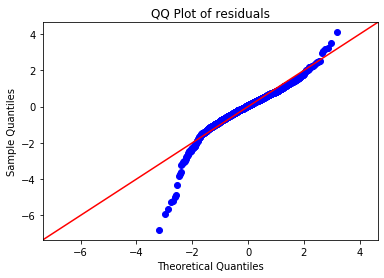

In [28]:
from matplotlib import pyplot as plt
import statsmodels.api as sm

fig = sm.qqplot(baseline_model.resid, fit=True, line='45')
plt.title("QQ Plot of residuals")
plt.show()

Woah! Non-normal! This means that we can't trust the results of what ANOVA would have been telling us. The safest bet here, in my opinion, is find appropiate transformations for our numeric variables, run another model, and see if that improves the normality. If not, we'll need to debug our model (fun??).

We'll loop over all of our numeric variables, and print lambda's along with confidence intervals for them. This requires a very slight modification to our boxcox function.

In [29]:
# From our previous notebook
from scipy import stats

def calculate_and_plot_boxcox(variable, alpha=0.05, title_string="", plot_lower_bound=-20, plot_upper_bound=20):
    transformed_data, best_lambda, conf = stats.boxcox(variable, alpha=alpha)
    lambdas, corr_coef = stats.boxcox_normplot(variable, plot_lower_bound, plot_upper_bound)
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=lambdas, y=corr_coef))
    fig.add_shape(dict(type="line", x0=best_lambda, x1=best_lambda, y0=0, y1=1))
    fig.add_shape(dict(type="line", x0=conf[0], x1=conf[0], y0=0, y1=1, line=dict(color="Red", width=1)))
    fig.add_shape(dict(type="line", x0=conf[1], x1=conf[1], y0=0, y1=1, line=dict(color="Red", width=1)))
    fig.add_shape(dict(type="line", x0=1, x1=1, y0=0, y1=1, line=dict(color="Red", width=1, dash="dash")))
    fig.update_layout(xaxis_title="Lambda Value", yaxis_title="Correlation Coefficient", title="Box-Cox Normality Plot ({})".format(title_string))
    
    # return the confidence interval too
    return transformed_data, best_lambda, conf, fig

In [30]:
eps = 1e-6

## Loop over the numeric data and print the variable name alongside the best lambda transformation and it's confidence interval
for var in numeric_data:
    _, best_lambda, conf, _ = calculate_and_plot_boxcox(house_df[var] + eps)
    print(var, "\t", best_lambda, "\t", conf)

C:\Python\Python37\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning:

overflow encountered in multiply

C:\Python\Python37\lib\site-packages\scipy\optimize\optimize.py:1985: RuntimeWarning:

invalid value encountered in double_scalars



YearRemodAdd 	 40.082303623241785 	 (33.45835036534877, 46.76904288759567)
FirstFlrSF 	 -0.025269385868785816 	 (-0.1660236024268833, 0.11607113718772241)
YearBuilt 	 22.012391881657255 	 (18.27514229908779, 25.81634699416837)
OpenPorchSF 	 0.02664493564857656 	 (0.016722943112319963, 0.03658541429398182)
MiscVal 	 -1.595630975752459 	 (-1.6801589475816783, -1.5139867633761024)
LotArea 	 0.5758592478733995 	 (0.4986622823151149, 0.6535652555754963)
GrLivArea 	 0.1509597886226235 	 (0.01757876429304058, 0.2852017631566626)
MasVnrArea 	 -0.06073741383608223 	 (-0.0705062956298304, -0.05104083141611727)
TotalBsmtSF 	 0.6044508150218747 	 (0.5720120639147701, 0.6384761228546023)


I'm going to ignore the Year variables obviously, and for some of these variables, I'm actually going to investigate using the confidence intervals more as guidelines than strict rules to follow, because many of these variables show potential transformations close to zero. We'll appropriately transform the appropriate variables.

In [31]:
## Transform the variables how you think is correct
house_df["TotalBsmtSFSqrt"] = house_df["TotalBsmtSF"] ** 0.5
# house_df["MiscValInv15"] = 1/((house_df["MiscVal"] + eps) ** 1.5)
house_df["FirstFlrSFLog"] = np.log(house_df["FirstFlrSF"] + eps)
house_df["MasVnrAreaLog"] = np.log(house_df["MasVnrArea"] + eps)
house_df["GrLivAreaLog"] = np.log(house_df["GrLivArea"] + eps)
house_df["MasVnrAreaSqrt"] = house_df["MasVnrArea"] ** 0.5
house_df["OpenPorchSFLog"] = np.log(house_df["OpenPorchSF"] + eps)
house_df["LotAreaSqrt"] = house_df["LotArea"] ** 0.5

numeric_data = {"TotalBsmtSFSqrt", "FirstFlrSFLog", "GrLivAreaLog", "MasVnrAreaSqrt", "OpenPorchSFLog", "LotAreaSqrt", "YearBuilt", "YearRemodAdd"}
numeric_data

{'FirstFlrSFLog',
 'GrLivAreaLog',
 'LotAreaSqrt',
 'MasVnrAreaSqrt',
 'OpenPorchSFLog',
 'TotalBsmtSFSqrt',
 'YearBuilt',
 'YearRemodAdd'}

In [32]:
house_df[numeric_data]

,YearRemodAdd,LotAreaSqrt,YearBuilt,TotalBsmtSFSqrt,MasVnrAreaSqrt,FirstFlrSFLog,GrLivAreaLog,OpenPorchSFLog
0,2003,91.923882,2003,29.257478,14.000000,6.752270,7.444249,4.110874
1,1976,97.979590,1976,35.524639,0.000000,7.140453,7.140453,-13.815511
2,2002,106.066017,2001,30.331502,12.727922,6.824374,7.487734,3.737670
3,1970,97.724101,1915,27.495454,0.000000,6.867974,7.448334,3.555348
4,2000,119.415242,2000,33.837849,18.708287,7.043160,7.695303,4.430817
...,...,...,...,...,...,...,...,...
1455,2000,88.977525,1999,30.870698,0.000000,6.859615,7.406711,3.688879
1456,1988,114.782403,1978,39.268308,10.908712,7.636752,7.636752,-13.815511
1457,2006,95.089432,1941,33.941125,0.000000,7.080027,7.757906,4.094345
1458,1996,98.574845,1950,32.832910,0.000000,6.982863,6.982863,-13.815511


In [33]:
## Build a function to construct a formula string
def build_formula_string(response_var, cat_vars, num_vars):
    categorical_list = ["C({})".format(var) for var in cat_vars]
    categorical_string = " + ".join(categorical_list)
    numeric_string = " + ".join(num_vars)
    formula_string = "{} ~ {} + {}".format(response_var, categorical_string, numeric_string)
    
    return formula_string

formula_string = build_formula_string("SalePriceLog", categorical_data, numeric_data)
formula_string

'SalePriceLog ~ C(KitchenQual) + C(MSZoning) + C(GarageCars) + C(TotRmsAbvGrd) + C(Fireplaces) + C(MSSubClass) + C(PavedDrive) + C(Functional) + C(Neighborhood) + C(FullBath) + C(CentralAir) + C(BsmtQual) + C(OverallQual) + YearRemodAdd + LotAreaSqrt + YearBuilt + TotalBsmtSFSqrt + MasVnrAreaSqrt + FirstFlrSFLog + GrLivAreaLog + OpenPorchSFLog'

In [34]:
## Fit a new model on the transformed data
transformed_baseline_model = smf.ols(formula_string, house_df).fit()
transformed_baseline_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           SalePriceLog   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     147.4
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:28:40   Log-Likelihood:                 1079.7
No. Observations:                1417   AIC:                            -1965.
Df Residuals:                    1320   BIC:                            -1456.
Df Model:                          96                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.4754      0.837      0.568      0.570      -1.167       2.118
C(KitchenQual)[T.Fa]          -0.0970      0.030     -3.282      0.001      -0.155      -0.039
C(KitchenQual)[T.Gd]          -0.0627      0.018     -3.538      0.000      -0.098      -0.028
C(KitchenQual)[T.TA]          -0.0842      0.019     -4.350      0.000      -0.122      -0.046
C(MSZoning)[T.FV]              0.4860      0.060      8.114      0.000       0.368       0.603
C(MSZoning)[T.RH]              0.4171      0.061      6.890      0.000       0.298       0.536
C(MSZoning)[T.RL]              0.4164      0.051      8.139      0.000       0.316       0.517
C(MSZoning)[T.RM]              0.3584      0.048      7.415      0.000       0.264       0.453
C(GarageCars)[T.1]             0.0735      0.017      4.386      0.000       0.041       0.106
C(GarageCars)[T.2]             0.1106      0.017      6.437      0.000       0.077       0.144
C(GarageCars)[T.3]             0.1489      0.022      6.800      0.000       0.106       0.192
C(GarageCars)[T.4]             0.3443      0.063      5.459      0.000       0.221       0.468
C(TotRmsAbvGrd)[T.3]           0.2665      0.189      1.410      0.159      -0.104       0.637
C(TotRmsAbvGrd)[T.4]           0.2190      0.185      1.181      0.238      -0.145       0.583
C(TotRmsAbvGrd)[T.5]           0.1821      0.186      0.978      0.328      -0.183       0.547
C(TotRmsAbvGrd)[T.6]           0.1815      0.187      0.972      0.331      -0.185       0.548
C(TotRmsAbvGrd)[T.7]           0.1725      0.188      0.919      0.358      -0.196       0.541
C(TotRmsAbvGrd)[T.8]           0.1774      0.188      0.943      0.346      -0.192       0.546
C(TotRmsAbvGrd)[T.9]           0.1728      0.189      0.913      0.361      -0.198       0.544
C(TotRmsAbvGrd)[T.10]          0.1854      0.190      0.974      0.330      -0.188       0.559
C(TotRmsAbvGrd)[T.11]          0.1557      0.192      0.809      0.418      -0.222       0.533
C(TotRmsAbvGrd)[T.12]          0.1505      0.198      0.758      0.448      -0.239       0.540
C(TotRmsAbvGrd)[T.14]          0.1860      0.230      0.809      0.419      -0.265       0.637
C(Fireplaces)[T.1]             0.0304      0.008      3.598      0.000       0.014       0.047
C(Fireplaces)[T.2]             0.0616      0.015      4.133      0.000       0.032       0.091
C(Fireplaces)[T.3]             0.0524      0.061      0.861      0.389      -0.067       0.172
C(MSSubClass)[T.30]           -0.0586      0.022     -2.623      0.009      -0.102      -0.015
C(MSSubClass)[T.40]           -0.0448      0.062     -0.718      0.473      -0.167       0.078
C(MSSubClass)[T.45]           -0.0241      0.038     -0.636      0.525      -0.098       0.050
C(MSSubClass)[T.50]           -0.0108      

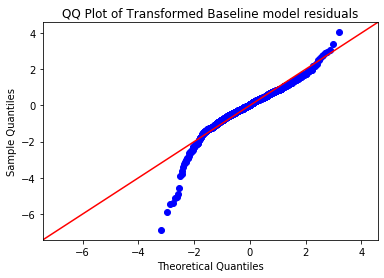

In [35]:
## Function-ize the fitted vs residual plots, and the qq plot
def plot_fitted_vs_resid(fitted_values, residuals, model_name):
    fig = px.scatter(x=fitted_values, y=residuals, labels={"x": "Fitted Values", "y": "Residuals"}, 
                      title="{} model, fitted values vs residuals".format(model_name))
    fig.show()
    
def plot_qq(residuals, model_name):
    fig = sm.qqplot(residuals, fit=True, line='45')
    plt.title("QQ Plot of {} model residuals".format(model_name))
    plt.show()
    
plot_fitted_vs_resid(transformed_baseline_model.fittedvalues, transformed_baseline_model.resid, "Transformed baseline")
plot_qq(transformed_baseline_model.resid, "Transformed Baseline")


Hmmm... still non-normal residuals. My next course of action would be to try and identify *where* this issue is coming from. As a starting point, let's fit two models - one with just the categorical data, and the other with the numerical data, and observe from which the spur in normality appears.

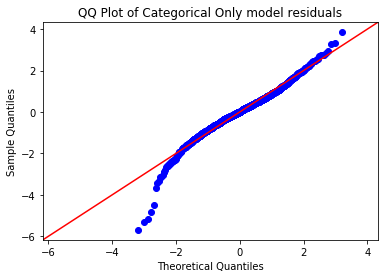

In [36]:
cat_only_formula_string = build_formula_string("SalePriceLog", categorical_data, [])
cat_only_model = smf.ols(cat_only_formula_string[:-2], house_df).fit()
plot_fitted_vs_resid(cat_only_model.fittedvalues, cat_only_model.resid, "Categorical Only")
plot_qq(cat_only_model.resid, "Categorical Only")

Ok... still present... Let's try with the numeric data?

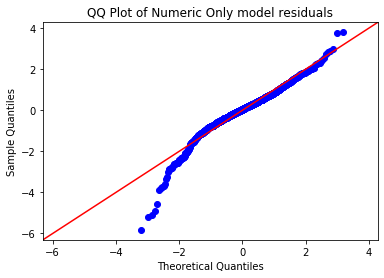

In [37]:
num_only_formula_string = build_formula_string("SalePriceLog", [], numeric_data)
num_only_model = smf.ols(num_only_formula_string, house_df).fit()
plot_fitted_vs_resid(num_only_model.fittedvalues, num_only_model.resid, "Numeric Only")
plot_qq(num_only_model.resid, "Numeric Only")

Still there!! Ok, so we know that this isn't occuring due to the presence of a single categorical or numerical variable. There's something underlying which hindering our assumptions. To remedy this, I'm going to remove the some datapoints based on their residual values. As I mentioned after fitting the baseline model, there were some points in the fitted vs residual plot which I identified may cause an issue. Here, I'm going to remove values under -0.3 and above 0.3. We'll then refit a new model, and hopefully this will have our residuals tend towards normality.

Note that we could have exploited the [Gauss-Markov Thereom](https://en.wikipedia.org/wiki/Gauss%E2%80%93Markov_theorem) here, or used a model which doesn't have normality as an assumption, e.g. Weighted Least Squares or Generalised Least Squares. Feel free to read up on these at your own leisure and attempt to make use of them.

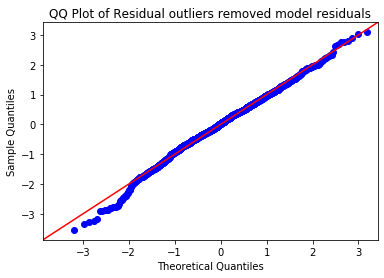

In [38]:
house_df["fitted"] = transformed_baseline_model.fittedvalues
house_df["resid"] = transformed_baseline_model.resid
house_df = house_df[house_df["resid"] > -0.3]
house_df = house_df[house_df["resid"] < 0.3]

outlier_resid_removed_transformed_model = smf.ols(formula_string, house_df).fit()

plot_fitted_vs_resid(outlier_resid_removed_transformed_model.fittedvalues, outlier_resid_removed_transformed_model.resid, "Residual outliers removed")
plot_qq(outlier_resid_removed_transformed_model.resid, "Residual outliers removed")

In [39]:
outlier_resid_removed_transformed_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           SalePriceLog   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     205.1
Date:                Mon, 17 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:28:41   Log-Likelihood:                 1318.9
No. Observations:                1390   AIC:                            -2444.
Df Residuals:                    1293   BIC:                            -1936.
Df Model:                          96                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      0.2390      0.709      0.337      0.736      -1.151       1.629
C(KitchenQual)[T.Fa]          -0.0892      0.025     -3.563      0.000      -0.138      -0.040
C(KitchenQual)[T.Gd]          -0.0681      0.015     -4.577      0.000      -0.097      -0.039
C(KitchenQual)[T.TA]          -0.0826      0.016     -5.078      0.000      -0.115      -0.051
C(MSZoning)[T.FV]              0.5157      0.058      8.922      0.000       0.402       0.629
C(MSZoning)[T.RH]              0.4688      0.058      8.046      0.000       0.354       0.583
C(MSZoning)[T.RL]              0.4746      0.052      9.200      0.000       0.373       0.576
C(MSZoning)[T.RM]              0.4086      0.050      8.212      0.000       0.311       0.506
C(GarageCars)[T.1]             0.0515      0.015      3.540      0.000       0.023       0.080
C(GarageCars)[T.2]             0.0855      0.015      5.762      0.000       0.056       0.115
C(GarageCars)[T.3]             0.1371      0.019      7.299      0.000       0.100       0.174
C(GarageCars)[T.4]             0.3167      0.053      6.031      0.000       0.214       0.420
C(TotRmsAbvGrd)[T.3]           0.2729      0.157      1.738      0.083      -0.035       0.581
C(TotRmsAbvGrd)[T.4]           0.2118      0.154      1.375      0.169      -0.090       0.514
C(TotRmsAbvGrd)[T.5]           0.1866      0.155      1.205      0.228      -0.117       0.490
C(TotRmsAbvGrd)[T.6]           0.1817      0.155      1.171      0.242      -0.123       0.486
C(TotRmsAbvGrd)[T.7]           0.1635      0.156      1.047      0.295      -0.143       0.470
C(TotRmsAbvGrd)[T.8]           0.1615      0.156      1.032      0.302      -0.145       0.468
C(TotRmsAbvGrd)[T.9]           0.1690      0.157      1.074      0.283      -0.140       0.478
C(TotRmsAbvGrd)[T.10]          0.1782      0.158      1.126      0.261      -0.132       0.489
C(TotRmsAbvGrd)[T.11]          0.1437      0.160      0.899      0.369      -0.170       0.457
C(TotRmsAbvGrd)[T.12]          0.1295      0.165      0.785      0.433      -0.194       0.453
C(TotRmsAbvGrd)[T.14]          0.1755      0.191      0.918      0.359      -0.200       0.551
C(Fireplaces)[T.1]             0.0335      0.007      4.730      0.000       0.020       0.047
C(Fireplaces)[T.2]             0.0678      0.013      5.413      0.000       0.043       0.092
C(Fireplaces)[T.3]             0.0476      0.051      0.942      0.346      -0.052       0.147
C(MSSubClass)[T.30]           -0.0699      0.019     -3.698      0.000      -0.107      -0.033
C(MSSubClass)[T.40]           -0.0556      0.052     -1.071      0.284      -0.157       0.046
C(MSSubClass)[T.45]           -0.0306      0.032     -0.970      0.332      -0.093       0.031
C(MSSubClass)[T.50]           -0.0103      

Awesome! I'm a lot happier with this plot. It's not 100% normal, but still passable. And we have an impressive $\text{Adj}R^2$ of 0.93!. Let's run ANOVA to identify some non-significant variables and start trimming down our model. Remember that we'll be using a higher pvalue of 0.2.

In [41]:
import statsmodels.api as sm

sm.stats.anova_lm(outlier_resid_removed_transformed_model, typ=2)

,sum_sq,df,F,PR(>F)
C(KitchenQual),0.246268,3.0,8.700244,1.024883e-05
C(MSZoning),0.863975,4.0,22.892111,2.689729e-18
C(GarageCars),0.778183,4.0,20.618942,1.730299e-16
C(TotRmsAbvGrd),0.194869,11.0,1.877559,3.821405e-02
C(Fireplaces),0.349223,3.0,12.337481,5.851212e-08
C(MSSubClass),0.860855,14.0,6.516984,7.066757e-13
C(PavedDrive),0.121361,2.0,6.431248,1.662438e-03
C(Functional),1.331166,6.0,23.513936,1.750917e-26
C(Neighborhood),1.818688,24.0,8.031403,4.360368e-26
C(FullBath),0.096315,3.0,3.402638,1.716115e-02


Well... surprisingly our data analysis was extensive enough that all of our included variables are signficant at alpha=0.2. If we wanted to use a linear regression model on this data, then we could lower our threshold to extract out some of the less signficant variables. However, if we wanted to fit some other kind of model to this data, (e.g. Regression Tree or SVMR), then the inclusion of these variables would be valuable.

We won't build a model here as I've left it as one of the lengthier challenges for this module. However, prior to concluding this notebook, we will get our dataframe in a format suitable to feed into a model. Namely, this involves `.get_dummies()` over the categorical variables in our dataframe.

In [42]:
# Constructing our model dataframe
model_df = house_df[list(categorical_data) + list(numeric_data)]
model_df["SalePriceLog"] = house_df["SalePriceLog"]
model_df

C:\Users\Nihir\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,KitchenQual,MSZoning,GarageCars,TotRmsAbvGrd,Fireplaces,MSSubClass,PavedDrive,Functional,Neighborhood,FullBath,...,OverallQual,YearRemodAdd,LotAreaSqrt,YearBuilt,TotalBsmtSFSqrt,MasVnrAreaSqrt,FirstFlrSFLog,GrLivAreaLog,OpenPorchSFLog,SalePriceLog
0,Gd,RL,2,8,0,60,Y,Typ,CollgCr,2,...,7,2003,91.923882,2003,29.257478,14.000000,6.752270,7.444249,4.110874,12.247694
1,TA,RL,2,6,1,20,Y,Typ,Veenker,2,...,6,1976,97.979590,1976,35.524639,0.000000,7.140453,7.140453,-13.815511,12.109011
2,Gd,RL,2,6,1,60,Y,Typ,CollgCr,2,...,7,2002,106.066017,2001,30.331502,12.727922,6.824374,7.487734,3.737670,12.317167
4,Gd,RL,3,9,1,60,Y,Typ,NoRidge,2,...,8,2000,119.415242,2000,33.837849,18.708287,7.043160,7.695303,4.430817,12.429216
5,TA,RL,2,5,0,50,Y,Typ,Mitchel,1,...,5,1995,118.806565,1993,28.213472,0.000000,6.679599,7.216709,3.401197,11.870600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,TA,RL,2,7,1,60,Y,Typ,Gilbert,2,...,6,2000,88.977525,1999,30.870698,0.000000,6.859615,7.406711,3.688879,12.072541
1456,TA,RL,2,7,2,20,Y,Min1,NWAmes,2,...,6,1988,114.782403,1978,39.268308,10.908712,7.636752,7.636752,-13.815511,12.254863
1457,Gd,RL,1,9,2,70,Y,Typ,Crawfor,2,...,7,2006,95.089432,1941,33.941125,0.000000,7.080027,7.757906,4.094345,12.493130
1458,Gd,RL,1,5,0,20,Y,Typ,NAmes,1,...,5,1996,98.574845,1950,32.832910,0.000000,6.982863,6.982863,-13.815511,11.864462


In [43]:
# Since we're using some numeric data as categorical, 
# we need to explicitly convert it to type category in prepartion for get_dummies
for var in categorical_data:
    model_df[var] = model_df[var].astype("category")

C:\Users\Nihir\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
model_df = pd.get_dummies(model_df)
model_df

,YearRemodAdd,LotAreaSqrt,YearBuilt,TotalBsmtSFSqrt,MasVnrAreaSqrt,FirstFlrSFLog,GrLivAreaLog,OpenPorchSFLog,SalePriceLog,KitchenQual_Ex,...,OverallQual_1,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10
0,2003,91.923882,2003,29.257478,14.000000,6.752270,7.444249,4.110874,12.247694,0,...,0,0,0,0,0,0,1,0,0,0
1,1976,97.979590,1976,35.524639,0.000000,7.140453,7.140453,-13.815511,12.109011,0,...,0,0,0,0,0,1,0,0,0,0
2,2002,106.066017,2001,30.331502,12.727922,6.824374,7.487734,3.737670,12.317167,0,...,0,0,0,0,0,0,1,0,0,0
4,2000,119.415242,2000,33.837849,18.708287,7.043160,7.695303,4.430817,12.429216,0,...,0,0,0,0,0,0,0,1,0,0
5,1995,118.806565,1993,28.213472,0.000000,6.679599,7.216709,3.401197,11.870600,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,2000,88.977525,1999,30.870698,0.000000,6.859615,7.406711,3.688879,12.072541,0,...,0,0,0,0,0,1,0,0,0,0
1456,1988,114.782403,1978,39.268308,10.908712,7.636752,7.636752,-13.815511,12.254863,0,...,0,0,0,0,0,1,0,0,0,0
1457,2006,95.089432,1941,33.941125,0.000000,7.080027,7.757906,4.094345,12.493130,0,...,0,0,0,0,0,0,1,0,0,0
1458,1996,98.574845,1950,32.832910,0.000000,6.982863,6.982863,-13.815511,11.864462,0,...,0,0,0,0,1,0,0,0,0,0


In [45]:
import pickle

pickle.dump(model_df, open("../DATA/house_df.pkl", "wb"))

loading_a_pickle_file = pickle.load(open("../DATA/house_df.pkl", "rb"))
loading_a_pickle_file.head()

,YearRemodAdd,LotAreaSqrt,YearBuilt,TotalBsmtSFSqrt,MasVnrAreaSqrt,FirstFlrSFLog,GrLivAreaLog,OpenPorchSFLog,SalePriceLog,KitchenQual_Ex,...,OverallQual_1,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10
0,2003,91.923882,2003,29.257478,14.000000,6.752270,7.444249,4.110874,12.247694,0,...,0,0,0,0,0,0,1,0,0,0
1,1976,97.979590,1976,35.524639,0.000000,7.140453,7.140453,-13.815511,12.109011,0,...,0,0,0,0,0,1,0,0,0,0
2,2002,106.066017,2001,30.331502,12.727922,6.824374,7.487734,3.737670,12.317167,0,...,0,0,0,0,0,0,1,0,0,0
4,2000,119.415242,2000,33.837849,18.708287,7.043160,7.695303,4.430817,12.429216,0,...,0,0,0,0,0,0,0,1,0,0
5,1995,118.806565,1993,28.213472,0.000000,6.679599,7.216709,3.401197,11.870600,0,...,0,0,0,0,1,0,0,0,0,0


👍

Here are some improvements we could perform on our analysis. It is encouraged to investigate and play around with some of these:
- Investigate interaction terms
- Augment variables with polynomials or exponential terms and see how they could improve performance
- Perform residual vs predictor plots (i.e. plotting model residuals against numric explanatory variables)
- Investigate the [Gauss-Markov Thereom](https://en.wikipedia.org/wiki/Gauss%E2%80%93Markov_theorem)
- Use a model which doesn't have normality as an assumption, e.g. Weighted Least Squares or Generalised Least Squares